# Scalable VQ‑VAE – multi‑scale demo
## Imports

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms.functional import to_tensor, to_pil_image
from sqvae import ScalableVQVAE, ModelArgs

## Model & weights

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = ScalableVQVAE.load(
    "svqvae_weights.safetensors",
    model_args=ModelArgs(
                codebook_size=16384,
                codebook_embed_dim=8,
                codebook_l2_norm=True,
                codebook_show_usage=True,
                commit_loss_beta=0.25,
                entropy_loss_ratio=0.0,
                encoder_ch_mult=[1, 2, 2, 4],
                decoder_ch_mult=[1, 2, 2, 4],
                z_channels=32,
                dropout_p=0.0,
            )
).to(device)

## Download and prepare the sample image

In [3]:
# Single Image
pil_img = Image.open("example.jpg").convert("RGB")

x = to_tensor(pil_img).unsqueeze(0)
x = x.to(device)

# Batch
# pil_img1 = Image.open("example_1.jpg").convert("RGB")
# pil_img2 = Image.open("example_2.jpg").convert("RGB")
# tensor1 = to_tensor(pil_img1)
# tensor2 = to_tensor(pil_img2)
# x1 = tensor1.unsqueeze(0)
# x2 = tensor2.unsqueeze(0)
# x = torch.cat([x1, x2], dim=0).to(device)

## Run the model (multi‑scale)

In [4]:
patch_nums = [4, 8, 16, 32, 64] # Scales - tokens per tile (4x4, 8x8, 16x16, 32x32, 64x64)

with torch.no_grad():
    reconstructions, _ = model(x, patch_nums=patch_nums, tile_size=512, overlap=256)

## Visualise (one figure per image, no sub‑plots)

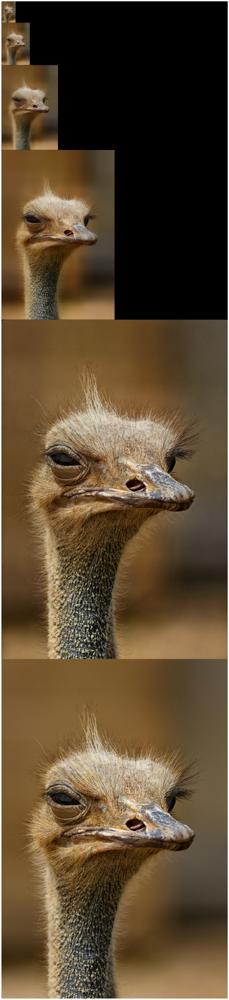

In [5]:
def stack_recons(original, reconstructions):
    def _plot_single(orig_t, rec_ts):
        pil_o = to_pil_image(orig_t.squeeze(0)).convert("RGB")
        W, H = pil_o.size
        o_arr = np.array(pil_o)

        canvases = []
        for r in rec_ts:
            pil_r = to_pil_image(r.squeeze(0)).convert("RGB")
            arr = np.array(pil_r)
            pad_w = W - arr.shape[1]
            if pad_w > 0:
                arr = np.pad(arr, ((0,0),(0,pad_w),(0,0)), constant_values=0)
            canvases.append(arr)

        canvases.append(o_arr)
        big = np.vstack(canvases)

        dpi = plt.rcParams['figure.dpi']
        fig, ax = plt.subplots(figsize=(W/dpi, big.shape[0]/dpi), dpi=dpi)
        ax.axis('off')
        ax.imshow(big)
        plt.show()

    if original.dim() == 4 and original.size(0) > 1:
        N = original.size(0)
        for i in range(N):
            oi = original[i].unsqueeze(0)
            recs_i = []
            for r in reconstructions:
                if torch.is_tensor(r) and r.dim() == 4:
                    recs_i.append(r[i].unsqueeze(0))
                else:
                    recs_i.append(r)
            _plot_single(oi, recs_i)
    else:
        _plot_single(original, reconstructions)


stack_recons(x, reconstructions)